# An introduction to understanding and forecasting electricity demand

In this notebook, we explore an electricity demand dataset in Belgium in 2018 and 2019. The ambient temperature during this period is also provided. Using historical data and exogenous variables, we explore different methods to forecast the electricity demand in a defined test period.

This notebook is divided into three parts:

1. Understanding the data
2. Creating baseline forecasters
3. Creating forecasters using machine learning

## Install necessary libraries

In [1]:
# ! pip install darts
# ! pip install ipywidgets
# ! pip install holidays
# ! pip install altair

## Import required libraries and packages

In [53]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import altair as alt
import sklearn

import holidays

from darts import TimeSeries
from darts.models import NaiveSeasonal, Theta, RegressionModel, LightGBMModel
from darts.metrics import mape, rmse, mae
from darts.utils.statistics import plot_acf

import warnings

warnings.filterwarnings("ignore")
import logging

logging.disable(logging.CRITICAL)

plt.rcParams["figure.figsize"] = (20,8)

## Load the dataset

In [3]:
data = pd.read_parquet('f4sg_dataset.parquet')
data

,Load,Temperature
time,,
2018-01-01 00:00:00,8143.500000,3.50
2018-01-01 01:00:00,7789.000000,3.74
2018-01-01 02:00:00,7470.750000,2.57
2018-01-01 03:00:00,7354.500000,1.96
2018-01-01 04:00:00,7374.250000,1.44
...,...,...
2020-01-01 19:00:00,9021.000000,0.19
2020-01-01 20:00:00,8912.250000,0.62
2020-01-01 21:00:00,9148.666667,-2.91


In [4]:
data.Load = data.Load / 1000 # Convert to GW

## Add important (calendar) features

In [5]:
data = data.reset_index()
data['Day_of_week'] = data['time'].dt.dayofweek
data['Hour_of_day'] = data['time'].dt.hour
data = data.set_index('time')
data

,Load,Temperature,Day_of_week,Hour_of_day
time,,,,
2018-01-01 00:00:00,8.143500,3.50,0,0
2018-01-01 01:00:00,7.789000,3.74,0,1
2018-01-01 02:00:00,7.470750,2.57,0,2
2018-01-01 03:00:00,7.354500,1.96,0,3
2018-01-01 04:00:00,7.374250,1.44,0,4
...,...,...,...,...
2020-01-01 19:00:00,9.021000,0.19,2,19
2020-01-01 20:00:00,8.912250,0.62,2,20
2020-01-01 21:00:00,9.148667,-2.91,2,21


In [6]:
data['Holidays'] = pd.Series(data.index).apply(lambda x: holidays.CountryHoliday('BE').get(x)).values
data['Holidays'] = data['Holidays'].astype('bool').astype('int')
data

,Load,Temperature,Day_of_week,Hour_of_day,Holidays
time,,,,,
2018-01-01 00:00:00,8.143500,3.50,0,0,1
2018-01-01 01:00:00,7.789000,3.74,0,1,1
2018-01-01 02:00:00,7.470750,2.57,0,2,1
2018-01-01 03:00:00,7.354500,1.96,0,3,1
2018-01-01 04:00:00,7.374250,1.44,0,4,1
...,...,...,...,...,...
2020-01-01 19:00:00,9.021000,0.19,2,19,1
2020-01-01 20:00:00,8.912250,0.62,2,20,1
2020-01-01 21:00:00,9.148667,-2.91,2,21,1


In [9]:
# This cell simply shows the holidays that have been added to the dataframe in the previous cell.

for date, name in sorted(holidays.BE(years=2018).items()):
    print(date, name)

print()
    
for date, name in sorted(holidays.BE(years=2019).items()):
    print(date, name)

2018-01-01 Nieuwjaarsdag
2018-04-01 Pasen
2018-04-02 Paasmaandag
2018-05-01 Dag van de Arbeid
2018-05-10 O.L.H. Hemelvaart
2018-05-20 Pinksteren
2018-05-21 Pinkstermaandag
2018-07-21 Nationale feestdag
2018-08-15 O.L.V. Hemelvaart
2018-11-01 Allerheiligen
2018-11-11 Wapenstilstand
2018-12-25 Kerstmis

2019-01-01 Nieuwjaarsdag
2019-04-21 Pasen
2019-04-22 Paasmaandag
2019-05-01 Dag van de Arbeid
2019-05-30 O.L.H. Hemelvaart
2019-06-09 Pinksteren
2019-06-10 Pinkstermaandag
2019-07-21 Nationale feestdag
2019-08-15 O.L.V. Hemelvaart
2019-11-01 Allerheiligen
2019-11-11 Wapenstilstand
2019-12-25 Kerstmis


## Add smoothed temperature as a variable

In [10]:
data['Smoothed_temperature'] = data.Temperature.rolling(337, center=True).mean()


## Visualize data

Let's first take a look at the overall electricity demand for the 2 years. It is obvious that demand peaks in winter (at over 13 GW) at the highest point and falls below 7 GW during the summer at its lowest. However, there are a number of localized variations. The most obvious of these is around Christmas time when there is a massive drop in demand. Less noticable, but this trend seems to repeat on many public holidays. In the transitional months, temperature changes also play an important role in determining this demand.

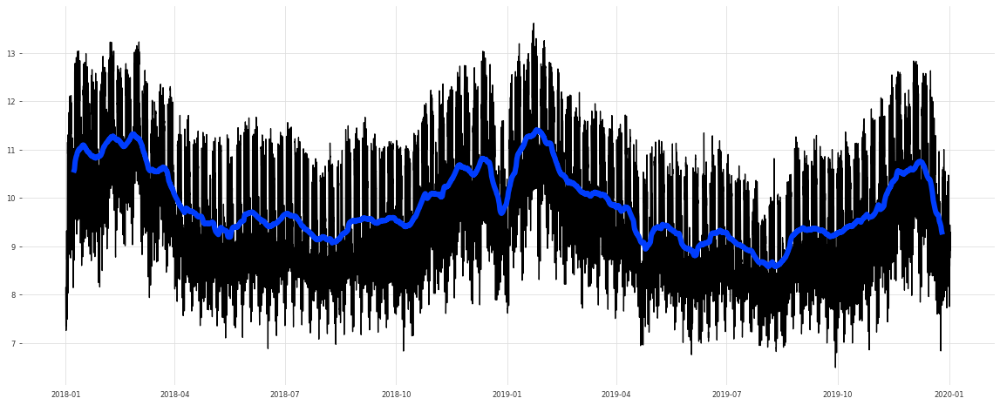

In [12]:
plt.plot(data.Load)
plt.plot(data.Load.rolling(337,center=True).mean(), lw=6)

At this point, you may want to plot the autocorrelation function of the time series to understand the seasonalities, and carry out a decomposition to further dig into the signal. 

For the sake of brevity, let's move on, and visualize how electricity demand varies as a function of day of the week (0 = Monday, 1 = Tuesday, ...). The weekends typically show diminished demand.


In [13]:
alt.data_transformers.disable_max_rows()
source = data

stripplot =  alt.Chart(source, width=40).mark_circle(size=8).encode(
    x=alt.X(
        'jitter:Q',
        title=None,
        axis=alt.Axis(values=[0], ticks=True, grid=False, labels=False),
        scale=alt.Scale(),
    ),
    y = alt.Y('Load:Q', scale=alt.Scale(domain=[5, 15])),
    color=alt.Color('Day_of_week:N', legend=None),
    tooltip=['Load', 'Temperature', 'Holidays', 'Hour_of_day'],
    column=alt.Column(
        'Day_of_week:N',
        header=alt.Header(
            labelAngle=-90,
            titleOrient='top',
            labelOrient='bottom',
            labelAlign='right',
            labelPadding=3,
        ),
    ),
).transform_calculate(
    # Generate Gaussian jitter with a Box-Muller transform
    jitter='sqrt(-2*log(random()))*cos(2*PI*random())'
).configure_facet(
    spacing=0
).configure_view(
    stroke=None
).properties(
    width=100,
    height=400
)

stripplot

alt.Chart(...)

Holidays also follow a similar trend as the weekends, as visualized next.

In [14]:
import altair as alt

alt.data_transformers.disable_max_rows()
source = data

stripplot =  alt.Chart(source, width=40).mark_circle(size=20).encode(
    x=alt.X(
        'jitter:Q',
        title=None,
        axis=alt.Axis(values=[0], ticks=True, grid=False, labels=False),
        scale=alt.Scale(),
    ),
    y = alt.Y('Load:Q', scale=alt.Scale(domain=[5, 15])),
    color=alt.Color('Holidays:N', legend=None),
    column=alt.Column(
        'Holidays:N',
        header=alt.Header(
            labelAngle=-90,
            titleOrient='top',
            labelOrient='bottom',
            labelAlign='right',
            labelPadding=3,
        ),
    ),
).transform_calculate(
    # Generate Gaussian jitter with a Box-Muller transform
    jitter='sqrt(-2*log(random()))*cos(2*PI*random())'
).configure_facet(
    spacing=0
).configure_view(
    stroke=None
).properties(
    width=200,
    height=400
)

stripplot

alt.Chart(...)

The time of the day is also quite important, with a bimodal electricity demand distribution.

In [16]:
import altair as alt

alt.data_transformers.disable_max_rows()
source = data

stripplot =  alt.Chart(source, width=40).mark_circle(size=8).encode(
    x=alt.X(
        'jitter:Q',
        title=None,
        axis=alt.Axis(values=[0], ticks=True, grid=False, labels=False),
        scale=alt.Scale(),
    ),
    y = alt.Y('Load:Q', scale=alt.Scale(domain=[5, 15])),
    color=alt.Color('Hour_of_day:N', legend=None),
    column=alt.Column(
        'Hour_of_day:N',
        header=alt.Header(
            labelAngle=-90,
            titleOrient='top',
            labelOrient='bottom',
            labelAlign='right',
            labelPadding=3,
        ),
    ),
).transform_calculate(
    # Generate Gaussian jitter with a Box-Muller transform
    jitter='sqrt(-2*log(random()))*cos(2*PI*random())'
).configure_facet(
    spacing=0
).configure_view(
    stroke=None
).properties(
    width=24,
    height=400
)

stripplot

alt.Chart(...)

Finally, let's see how load varies with increasing temperature. From around 11 GW (± 2 GW) of average load in winter months at 0 C, it goes down to 9 GW (± 2 GW) during summer when temperatures exceed 20 C.

In [17]:
scatter = alt.Chart(data).mark_circle(opacity=0.2).encode(
    x='Smoothed_temperature',
    y = alt.Y('Load', scale=alt.Scale(domain=[5, 15]))
).properties(
    width=800,
    height=300
)

scatter + scatter.transform_loess('Smoothed_temperature', 'Load', bandwidth=0.9).mark_line(color='red',size=4)


alt.LayerChart(...)

The correlation between temperature and load is also rather high, especially at high temporal aggregation levels (e.g. weekly or daily).

In [20]:
print(np.corrcoef(data.Temperature, data.Load))
print(np.corrcoef(data.Temperature.resample('D').mean(), data.Load.resample('D').mean()))
print(np.corrcoef(data.Temperature.resample('W').mean(), data.Load.resample('W').mean()))

[[ 1.         -0.29712053]
 [-0.29712053  1.        ]]
[[ 1.         -0.61150518]
 [-0.61150518  1.        ]]
[[ 1.         -0.81803578]
 [-0.81803578  1.        ]]


## Initializing Darts and formatting the dataset

Convert the dataframes into a Darts readable time series

In [48]:
load = TimeSeries.from_dataframe(data, value_cols=['Load'])


Create a function to evaluate different models using backtesting. Note that this is necessary to get a more robust estimate of a model's forecasting performance, and is definitely preferable to simply fitting the model to the entire dataset and comparing multiple models on the training set accuracy. The downside is obviously that it is more computationally intensive.

In [31]:
def eval_model(model, past_covariates=None, future_covariates=None, to_retrain=True):
    
    backtest = model.historical_forecasts(series=load, 
                                          past_covariates=past_covariates,
                                          future_covariates=future_covariates,
                                          start=pd.to_datetime('2019-10-15'), 
                                          retrain=to_retrain,
                                          verbose=True, 
                                          forecast_horizon=24)
    
    load[-len(backtest)-336:].plot()
    backtest.plot(label='Backtest')
    print('Backtest MAPE = {}'.format(mape(load, backtest)))
    plt.show()

    error = load[-len(backtest):].pd_series() - backtest.pd_series()
    error.rolling(49, center=True).mean().plot()
    plt.show()


## Building forecast models using Darts

We begin by creating two naive models, one with daily seasonality and another with weekly seasonality. Any 'smart' forecaster will have to beat these two very simple baselines.

  0%|          | 0/1873 [00:00<?, ?it/s]

Backtest MAPE = 5.6694282359627115


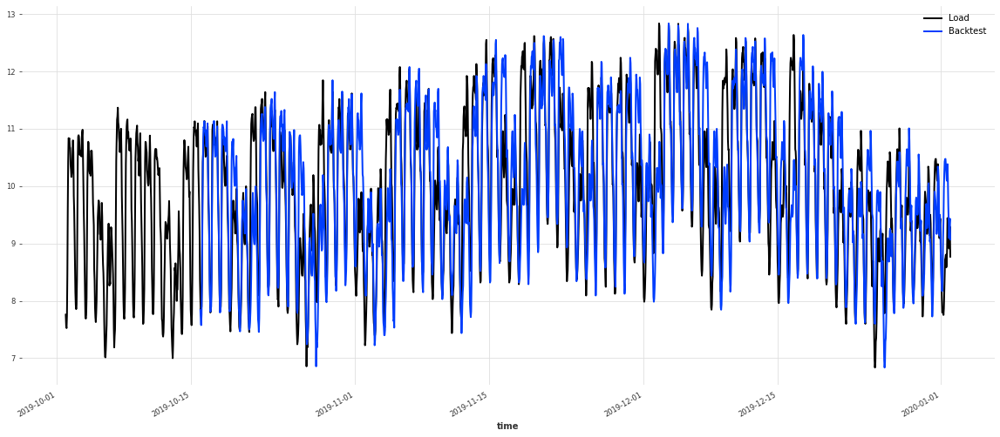

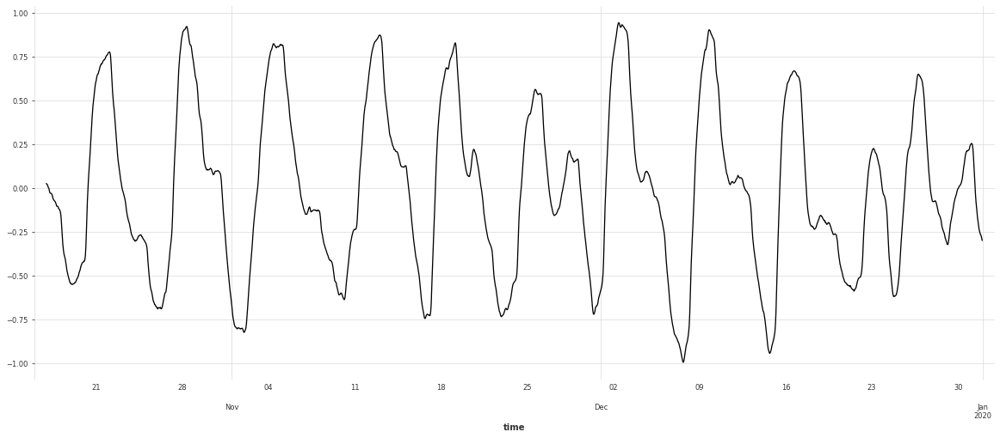

In [33]:
naive_model = NaiveSeasonal(K=24)
naive_model.fit(load_train)
eval_model(naive_model)


  0%|          | 0/1873 [00:00<?, ?it/s]

Backtest MAPE = 5.315803891824644


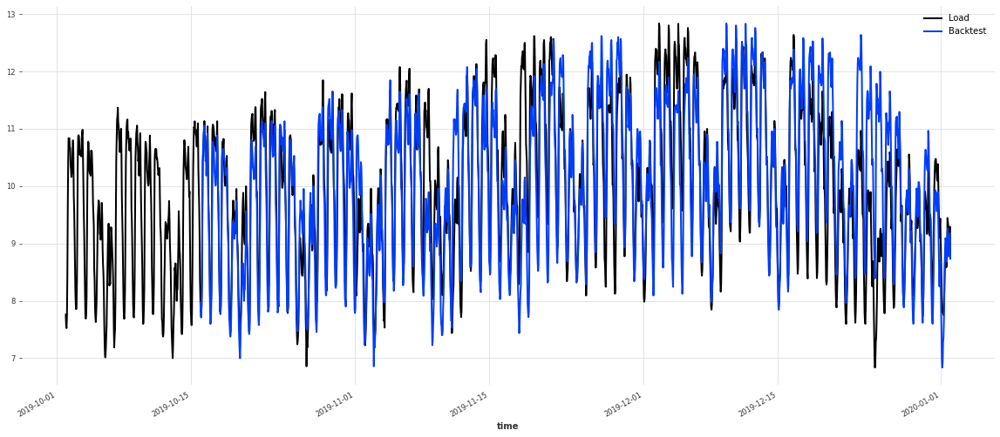

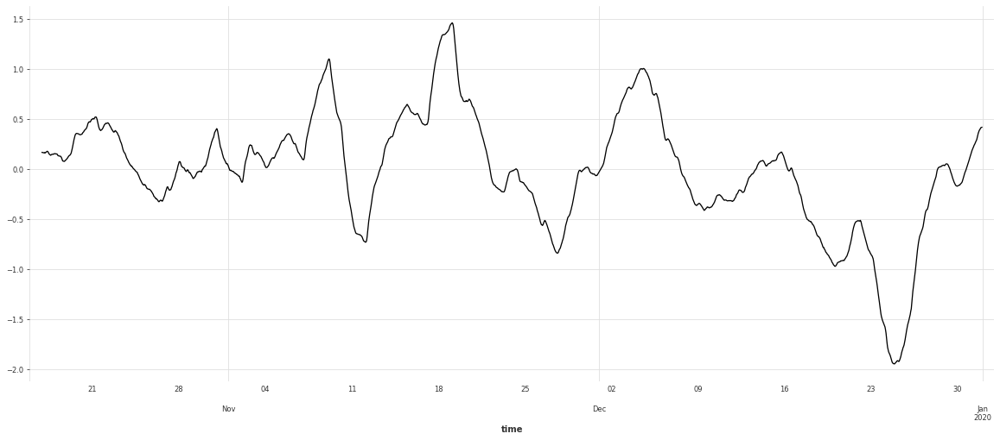

In [34]:
naive_model = NaiveSeasonal(K=168)
naive_model.fit(load_train)
eval_model(naive_model)


Based on the MAPE, it is obvious that the weekly seasonality leads to a better forecast. Visualizing the error signal, is also obvious that the two forecasters make different errors. The weekly seasonal forecaster performs especially poorly during the Christmas period, while the daily seasonal forecast makes poor forecasts in days around the weekends.

The next forecast we use as a benchmark is the Theta model. This is a very simple algorithm, but one that has won quite a few forecasting competitions. One obvious challenge with this algorithm is that it cannot take into account exogenous variables such as temperature or holidays etc.


  0%|          | 0/1873 [00:00<?, ?it/s]

Backtest MAPE = 3.853747618263464


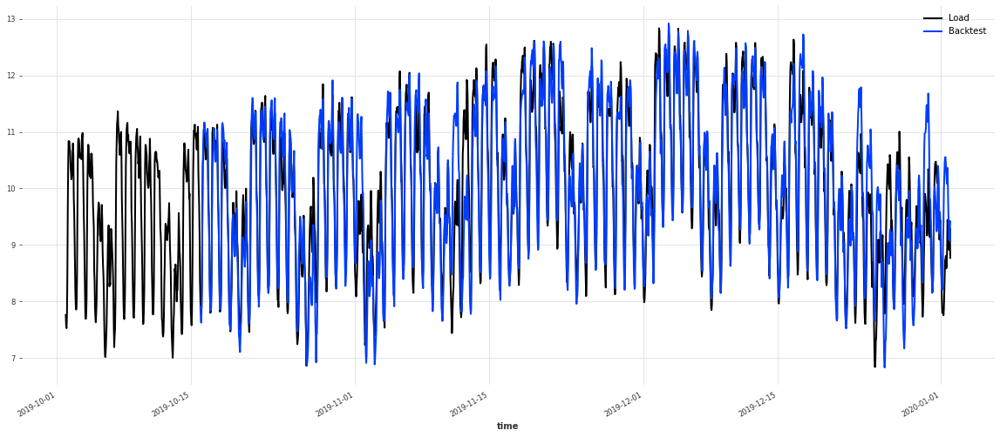

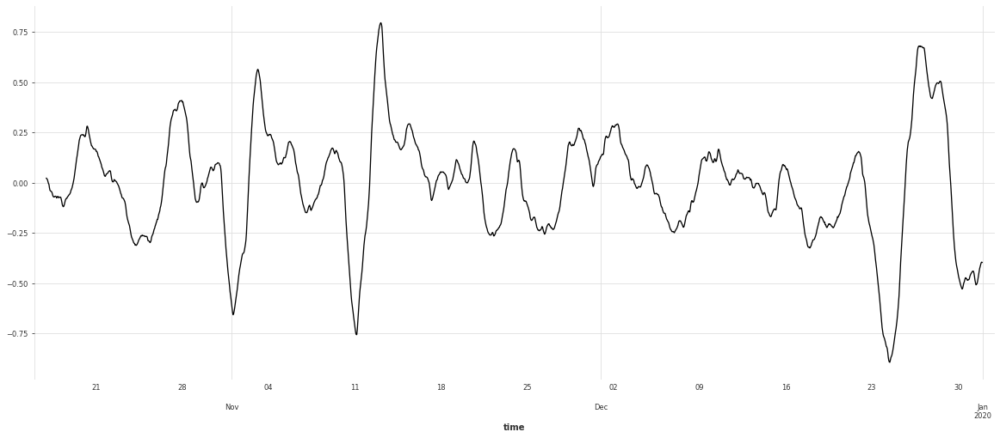

In [42]:
theta_model = Theta(seasonality_period=168)
theta_model.fit(load_train)
eval_model(theta_model)


It seems like the Theta model vastly outperforms the naive models (but also takes considerably longer). Predictably, it also shows high errors on holidays (1st November, 11th November and Christmas). 

Now, let's build a first, very simple regression model to make our forecasts. As a first guess, this forecaster simply takes as input the previous 168 lags (of the historical time series) to make its prediction. As we see, the accuracy is better than the naive models but is much worse than the Theta model. Can we improve?


  0%|          | 0/1873 [00:00<?, ?it/s]

Backtest MAPE = 4.518389455096036


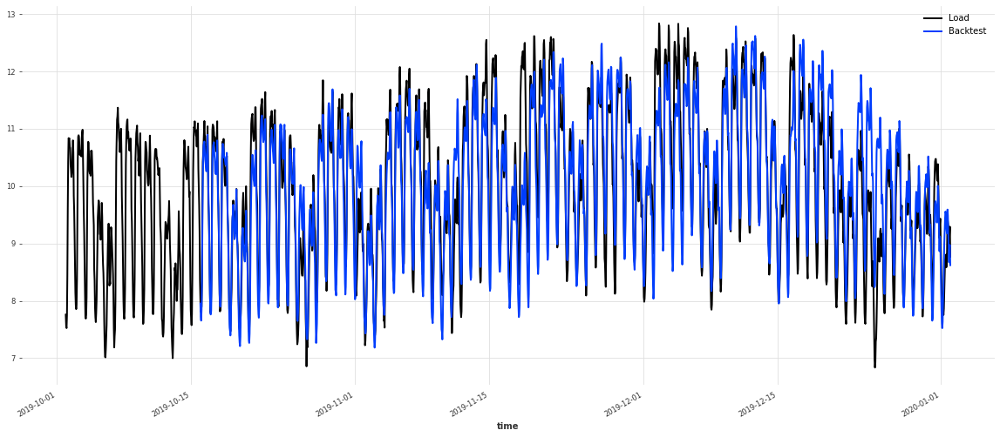

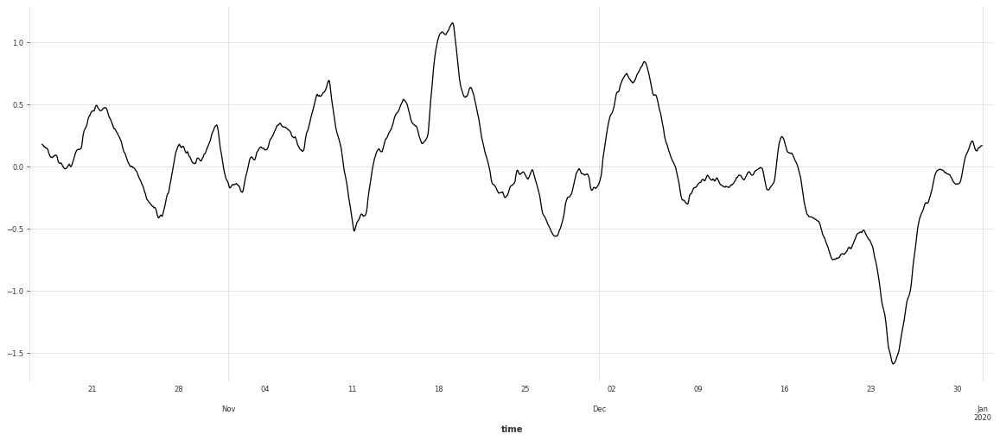

In [36]:
regr_model_lags = RegressionModel(lags=list(range(-168,0)))
regr_model_lags.fit(load_train)
eval_model(regr_model_lags, to_retrain=False)


One obvious way to try to improve the performance of the model is by playing with the input features going into the model. Without going into feature transformations and engineering, the simplest we can try is to change the window length. Here, it seems that a longer time window yields a lower error.

  0%|          | 0/1873 [00:00<?, ?it/s]

Backtest MAPE = 4.104415274481747


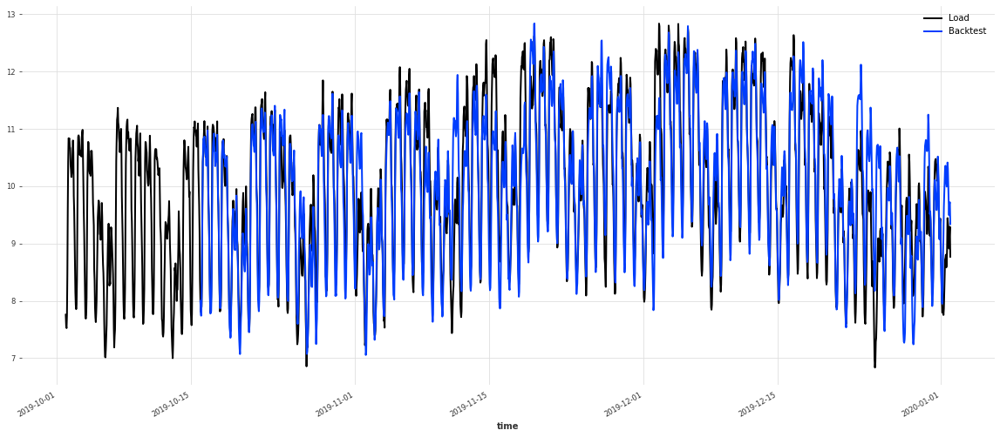

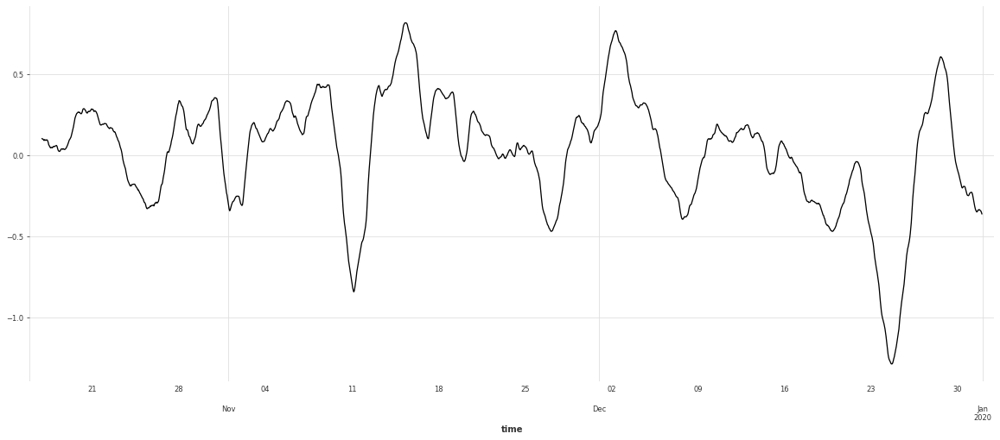

In [43]:
regr_model_cov = RegressionModel(lags=list(range(-672,0)))
regr_model_cov.fit(load_train)

eval_model(regr_model_cov, to_retrain=False)


While an improvement, this model still is worse than the Theta model we saw earlier. Perhaps including the exogenous variables (time of day and day of year) will help matters. Let's try!

  0%|          | 0/1850 [00:00<?, ?it/s]

Backtest MAPE = 3.8458351074783175


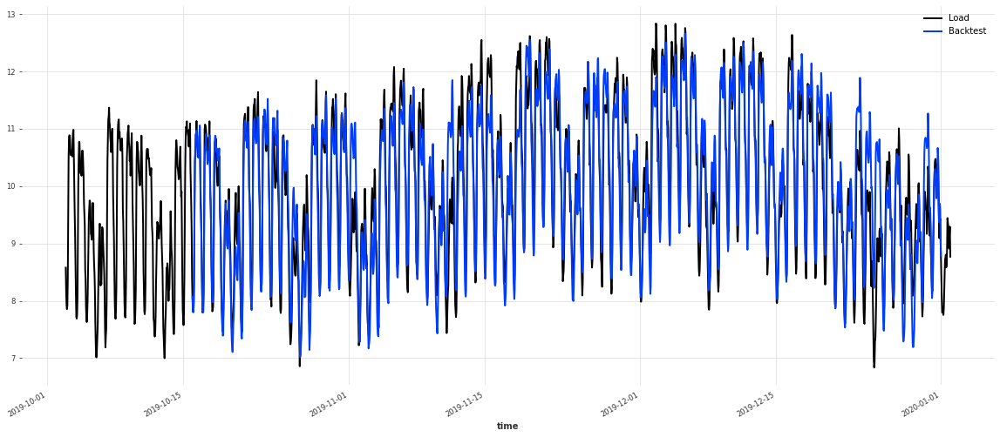

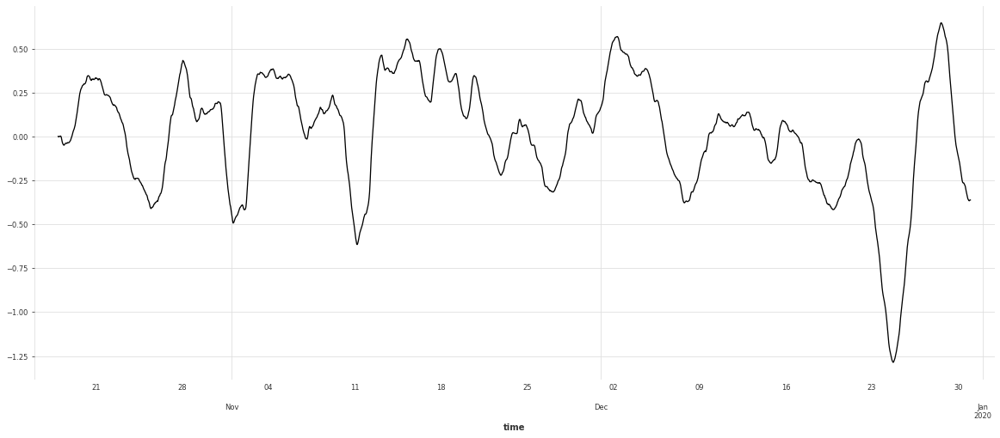

In [49]:
future = TimeSeries.from_dataframe(data, value_cols=['Day_of_week', 'Hour_of_day'])

regr_model_cov = RegressionModel(lags=list(range(-672,0)),
                                 lags_future_covariates=list(range(24)))
regr_model_cov.fit(load_train, 
                   future_covariates=future)

eval_model(regr_model_cov, to_retrain=False)


This model is already a vast improvement over previous iterations, and seems comparable to the Theta forecaster we saw earlier. However, it also makes poor predictions around the two November holidays and Christmas. Adding the holidays variable we defined earlier can possibly help rectify this?

  0%|          | 0/1850 [00:00<?, ?it/s]

Backtest MAPE = 3.524293945508265


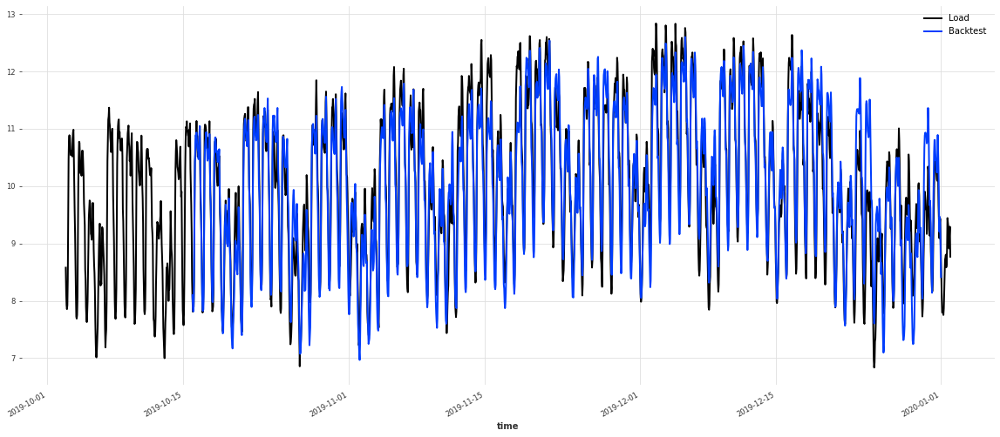

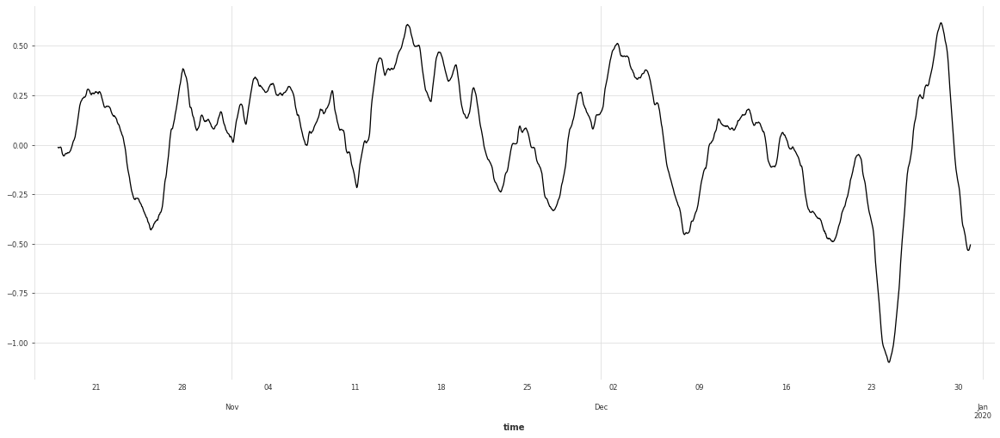

In [50]:
future = TimeSeries.from_dataframe(data, value_cols=['Day_of_week', 'Hour_of_day', 'Holidays'])

regr_model_cov = RegressionModel(lags=list(range(-672,0)),
                                 lags_future_covariates=list(range(24)))

regr_model_cov.fit(load_train, 
                   future_covariates=future)

eval_model(regr_model_cov, to_retrain=False)


OK that helped clean up the high November errors, but there is still a considerable error on Christmas. This is due to the fact that we only tagged Christmas day as a holiday, but the entire week between Christmas and NYE sees considerably depressed electricity demand. This can be fixed by adding some more variables (try this at home).

Finally, let's check whether adding temperature into the mix further improves results.

  0%|          | 0/1850 [00:00<?, ?it/s]

Backtest MAPE = 3.2268015744017373


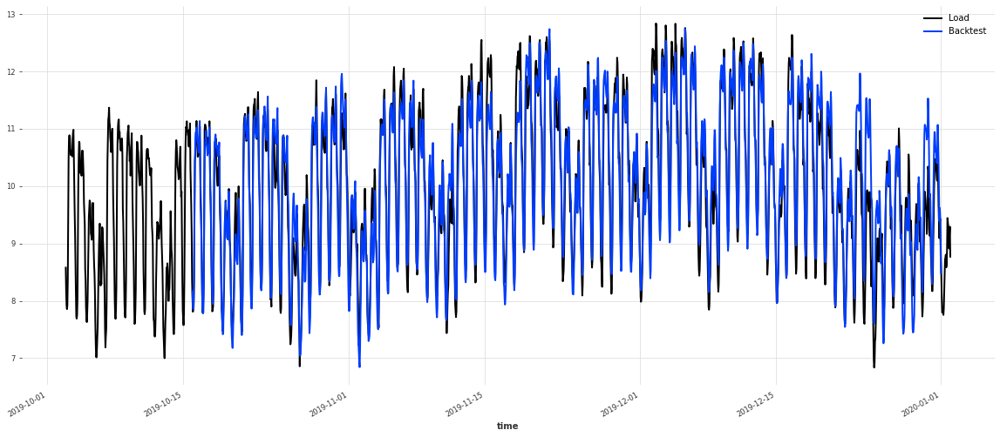

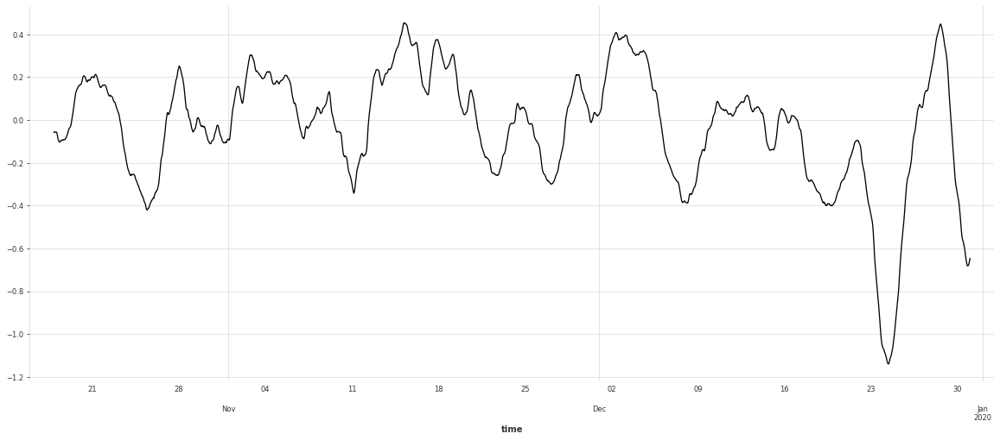

In [51]:
future = TimeSeries.from_dataframe(data, value_cols=['Temperature', 'Day_of_week', 'Hour_of_day', 'Holidays'])

regr_model_cov = RegressionModel(lags=list(range(-672,0)),
                                 lags_future_covariates=list(range(24)))

regr_model_cov.fit(load_train, 
                   future_covariates=future)

eval_model(regr_model_cov, to_retrain=False)


This yields by far the most accurate model we have trained so far. However, recall that so far we have used the default linear model to build our forecasters. There are plenty of other model types (all of Scikit-learn is supported). Let's try the popular LightGBM model to see how it does (without any hyperparameter tuning). The only change we make to the default settings is to set the 'output_chunk_length' to our forecast horizon.

  0%|          | 0/1850 [00:00<?, ?it/s]

Backtest MAPE = 3.00079933666115


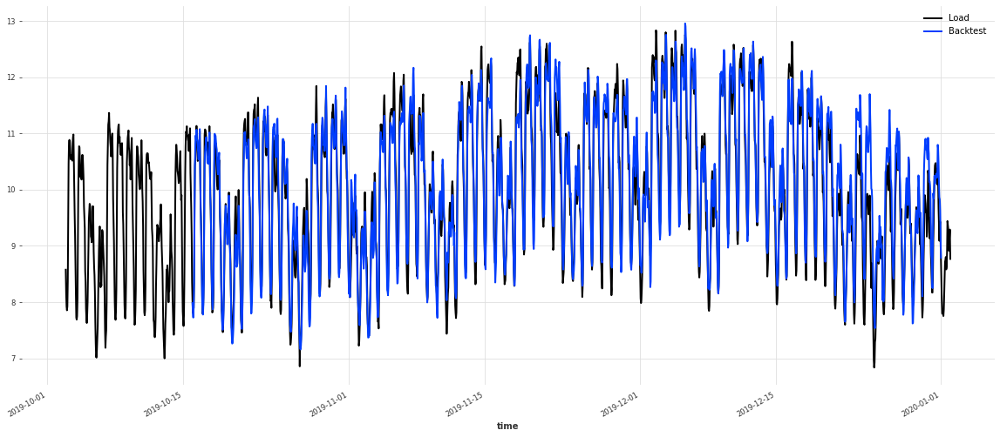

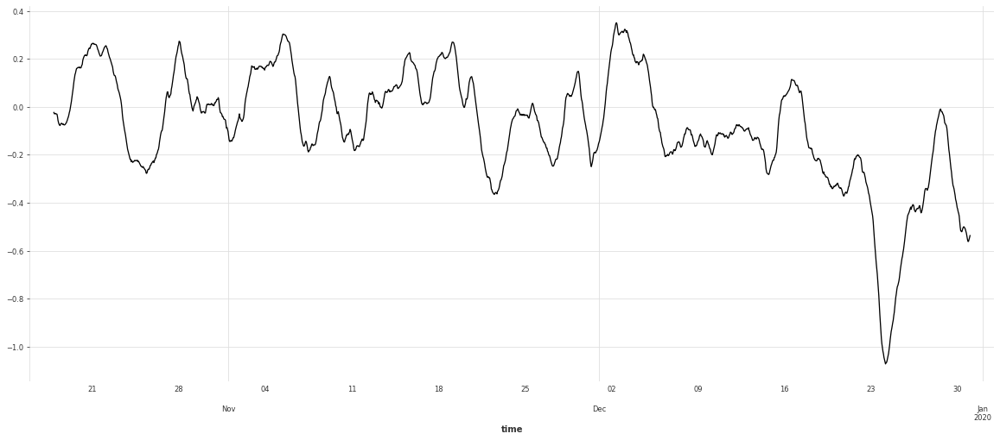

In [55]:
future = TimeSeries.from_dataframe(data, value_cols=['Temperature', 'Day_of_week', 'Hour_of_day', 'Holidays'])

regr_model_cov = LightGBMModel(lags=list(range(-672,0)),
                               lags_future_covariates=list(range(24)),
                               output_chunk_length=24)

regr_model_cov.fit(load_train, 
                   future_covariates=future)

eval_model(regr_model_cov, to_retrain=False)


This further reduces the error, but also indicates that it is quite likely that another hyperparameter configuration exists which can even further reduce the forecast error. You can try this out using the 'gridsearch' function in Darts.


## Next steps

In this notebook, we have seen how calendar features such as time of day, day of year and holidays effect electricity demand. We have also shown how these variables can help reduce the forecast errors when compared with simpler models that are oblivious of stuff like holidays. 

As next steps, you could:

1. Change the model and input features to better model the Christmas period,
2. Try ensemble models combining different forecasters,
3. Normalize the input features,
4. Properly encode the calendar features (e.g. using cyclic encodings),
5. Check what happens if we retrain the model periodically
6. ...
